# EDA

In [2]:
import pandas as pd
import numpy as np

In [3]:
data = pd.read_csv('processed_data.csv')

In [10]:
df1 = data

In [5]:
import numpy as np # linear algebra
import pandas as pd # data processing
import os
import tweepy as tw #for accessing Twitter API


#For Preprocessing
import re    # RegEx for removing non-letter characters
import nltk  #natural language processing
nltk.download("stopwords")
from nltk.corpus import stopwords
from nltk.stem.porter import *

# For Building the model
from sklearn.model_selection import train_test_split
import tensorflow as tf
import seaborn as sns

#For data visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline

pd.options.plotting.backend = "plotly"

C:\Users\Vidipt\anaconda3\lib\site-packages\scipy\__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Vidipt\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [12]:
df1 = df1[['clean_tweet' , 'Sentiment']]

In [14]:
df1.head()

,clean_tweet,Sentiment
0,anfieldedition performance like becoming much ...,Positive
1,kcchemguy derek wolfe95 certain situation shan...,Positive
2,ettingermentum think social alienation le prob...,Negative
3,lbc aliciakearns vegan know significantly redu...,Negative
4,time love reliance end httpstcowcuuxixqsi,Positive


In [15]:
df1.isnull().sum()

clean_tweet    111
Sentiment        0
dtype: int64

In [16]:
df=df1

In [18]:
df.dropna(axis=0 ,inplace=True)

<ipython-input-18-95c2e75cd933>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(axis=0 ,inplace=True)


In [19]:
df.isnull().sum()

clean_tweet    0
Sentiment      0
dtype: int64

In [20]:
df.shape

(127142, 2)

In [21]:
df.head()

,clean_tweet,Sentiment
0,anfieldedition performance like becoming much ...,Positive
1,kcchemguy derek wolfe95 certain situation shan...,Positive
2,ettingermentum think social alienation le prob...,Negative
3,lbc aliciakearns vegan know significantly redu...,Negative
4,time love reliance end httpstcowcuuxixqsi,Positive


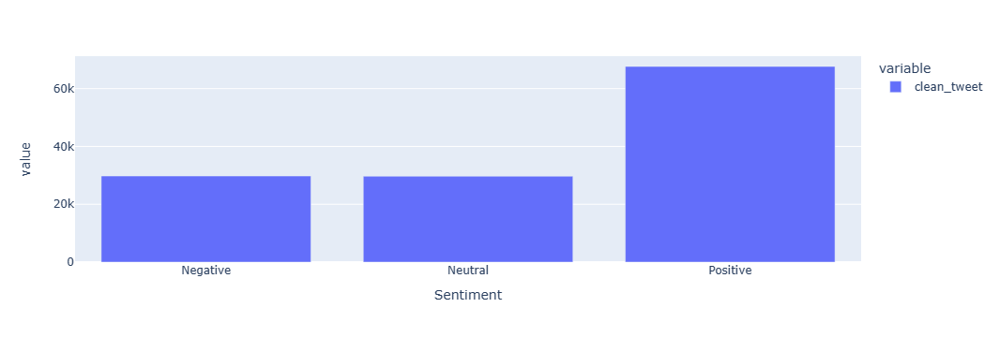

In [23]:
df.groupby('Sentiment').count().plot(kind='bar')

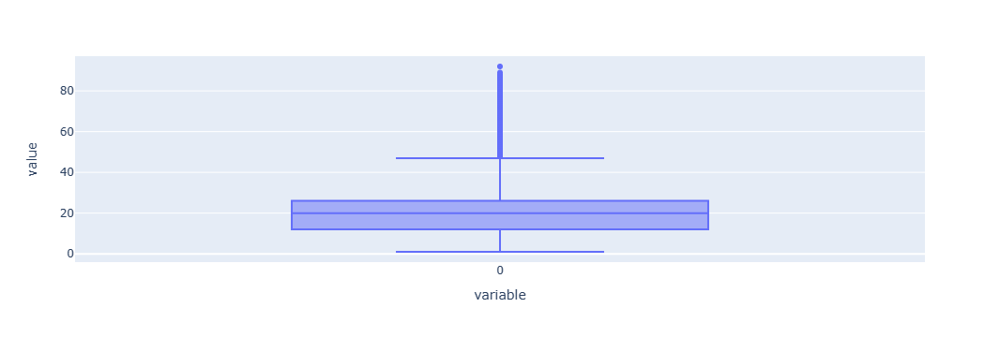

In [24]:
# Calculate tweet lengths
tweet_len = pd.Series([len(tweet.split()) for tweet in df['clean_tweet']])

# The distribution of tweet text lengths
tweet_len.plot(kind='box')

<ipython-input-28-79d102738eb7>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



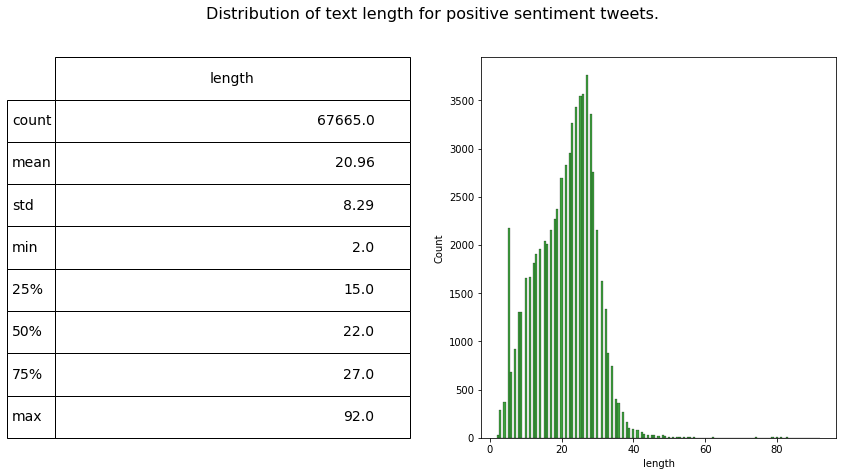

In [28]:
fig = plt.figure(figsize=(14,7))
df['length'] = df.clean_tweet.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(df[df['Sentiment']=='Positive']['length'], ax=ax1,color='green')
describe = df.length[df.Sentiment=='Positive'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for positive sentiment tweets.', fontsize=16)

plt.show()

<ipython-input-30-30c82a12a3df>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



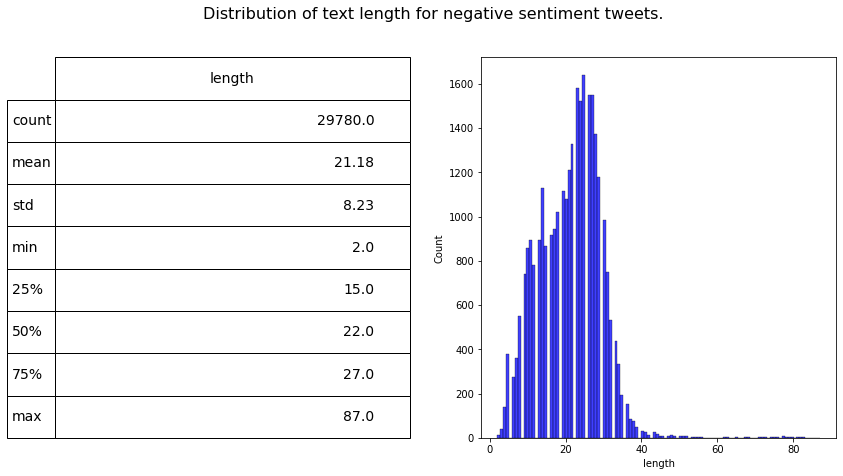

In [30]:
fig = plt.figure(figsize=(14,7))
df['length'] = df.clean_tweet.str.split().apply(len)
ax1 = fig.add_subplot(122)
sns.histplot(df[df['Sentiment']=='Negative']['length'], ax=ax1,color='blue')
describe = df.length[df.Sentiment=='Negative'].describe().to_frame().round(2)

ax2 = fig.add_subplot(121)
ax2.axis('off')
font_size = 14
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of text length for negative sentiment tweets.', fontsize=16)

plt.show()

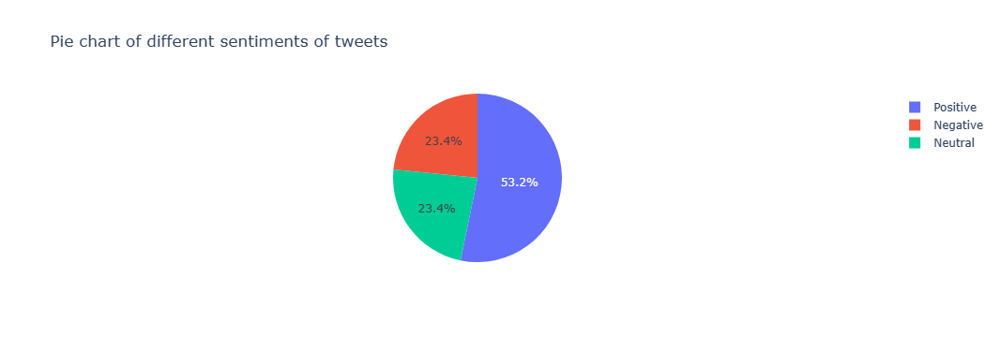

In [31]:
import plotly.express as px
fig = px.pie(df, names='Sentiment', title ='Pie chart of different sentiments of tweets')
fig.show()

In [33]:
df.drop(['length'], axis=1, inplace=True)
df.head

C:\Users\Vidipt\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<bound method NDFrame.head of                                               clean_tweet Sentiment
0       anfieldedition performance like becoming much ...  Positive
1       kcchemguy derek wolfe95 certain situation shan...  Positive
2       ettingermentum think social alienation le prob...  Negative
3       lbc aliciakearns vegan know significantly redu...  Negative
4               time love reliance end httpstcowcuuxixqsi  Positive
...                                                   ...       ...
127248  natural gas tight market expected reliance sto...  Positive
127249  brisco 0317 proud 2b blue dpbeachny gorillasty...  Positive
127250  aerial perspective residential highrise social...  Positive
127251  2until imposition income tax world war tariff ...  Positive
127252  repkatieporter entire pharma industry need rei...  Positive

[127142 rows x 2 columns]>

In [36]:
df.head()

,clean_tweet,Sentiment
0,anfieldedition performance like becoming much ...,Positive
1,kcchemguy derek wolfe95 certain situation shan...,Positive
2,ettingermentum think social alienation le prob...,Negative
3,lbc aliciakearns vegan know significantly redu...,Negative
4,time love reliance end httpstcowcuuxixqsi,Positive


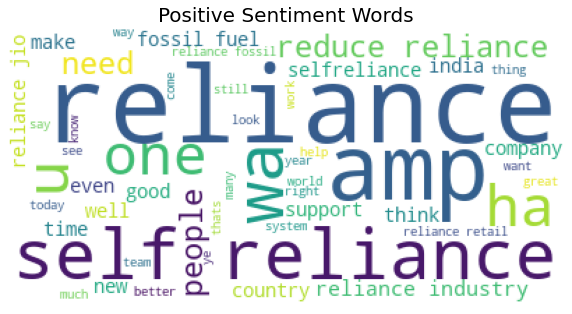

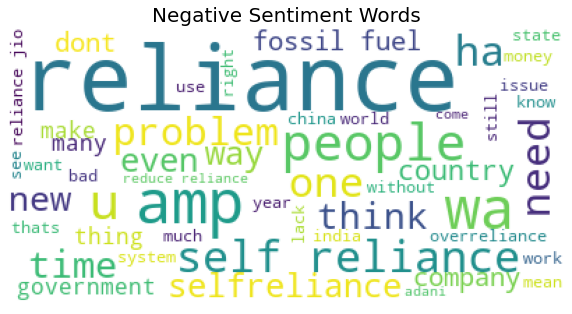

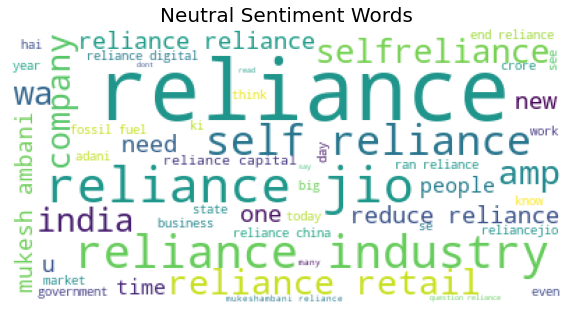

In [39]:
from wordcloud import WordCloud, STOPWORDS

def wordcount_gen(df, Sentiment):
    '''
    Generating Word Cloud
    inputs:
       - df: tweets dataset
       - category: Positive/Negative/Neutral
    '''
    # Combine all tweets
    combined_tweets = " ".join([tweet for tweet in df[df.Sentiment==Sentiment]['clean_tweet']])
                          
    # Initialize wordcloud object
    wc = WordCloud(background_color='white', 
                   max_words=50, 
                   stopwords = STOPWORDS)

    # Generate and plot wordcloud
    plt.figure(figsize=(10,10))
    plt.imshow(wc.generate(combined_tweets))
    plt.title('{} Sentiment Words'.format(Sentiment), fontsize=20)
    plt.axis('off')
    plt.show()
    
# Positive tweet words
wordcount_gen(df, 'Positive')
     
# Negative tweet words
wordcount_gen(df, 'Negative')
     
# Neutral tweet words
wordcount_gen(df, 'Neutral')
     

In [44]:
def tweet_to_words(tweet):
    ''' Convert tweet text into a sequence of words '''
    
    # convert to lowercase
    text = tweet.lower()
    # remove non letters
    text = re.sub(r"[^a-zA-Z0-9]", " ", text)
    # tokenize
    words = text.split()
    # remove stopwords
    words = [w for w in words if w not in stopwords.words("english")]
    # apply stemming
    words = [PorterStemmer().stem(w) for w in words]
    # return list
    return words

In [45]:
X = list(map(tweet_to_words, df['clean_tweet']))

In [47]:
from sklearn.preprocessing import LabelEncoder

# Encode target labels
le = LabelEncoder()
Y = le.fit_transform(df['Sentiment'])

In [50]:
y = pd.get_dummies(df['Sentiment'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

In [51]:
from sklearn.feature_extraction.text import CountVectorizer
#from sklearn.feature_extraction.text import TfidfVectorizer

vocabulary_size = 5000

# Tweets have already been preprocessed hence dummy function will be passed in 
# to preprocessor & tokenizer step
count_vector = CountVectorizer(max_features=vocabulary_size,
#                               ngram_range=(1,2),    # unigram and bigram
                                preprocessor=lambda x: x,
                               tokenizer=lambda x: x) 
#tfidf_vector = TfidfVectorizer(lowercase=True, stop_words='english')

# Fit the training data
X_train = count_vector.fit_transform(X_train).toarray()

# Transform testing data
X_test = count_vector.transform(X_test).toarray()

In [52]:
print(count_vector.get_feature_names()[0:200])

['0', '01', '01401244', '05', '1', '10', '100', '1000', '10000', '1006', '100emir', '102', '10dell', '10th', '11', '110029', '115', '12', '120', '1240', '13', '135', '13bmw', '14', '140', '148', '14th', '15', '150', '1500', '151', '15792', '15th', '16', '168', '17', '18', '1800', '18000', '18ferrari', '19', '1980', '1983', '1990', '1samsung', '1st', '2', '20', '200', '2000', '20000', '2002', '2005', '2008', '2009', '200sma', '2010', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '202223', '2023', '2024', '2025', '2027', '2030', '20relianc', '20th', '21', '21st', '22', '2200', '222', '23', '2300', '233', '2350', '2380', '23huawei', '24', '2400', '2460', '247', '25', '250', '2500', '2550', '2560', '2580', '25th', '26', '2600', '27', '2700', '28', '2850', '29', '2g', '2microsoft', '2nd', '2pm', '3', '30', '300', '3000', '31', '32', '33', '34', '34honda', '35', '36', '37', '3720', '38', '39', '3d', '3ibm', '3pm', '3rd', '4', '40', '400', '41', '42',

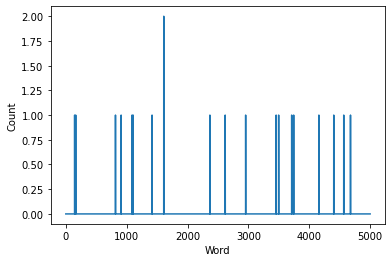

In [53]:
# Plot the BoW feature vector
plt.plot(X_train[2,:])
plt.xlabel('Word')
plt.ylabel('Count')
plt.show()

In [55]:
df

,clean_tweet,Sentiment
0,anfieldedition performance like becoming much ...,Positive
1,kcchemguy derek wolfe95 certain situation shan...,Positive
2,ettingermentum think social alienation le prob...,Negative
3,lbc aliciakearns vegan know significantly redu...,Negative
4,time love reliance end httpstcowcuuxixqsi,Positive
...,...,...
127248,natural gas tight market expected reliance sto...,Positive
127249,brisco 0317 proud 2b blue dpbeachny gorillasty...,Positive
127250,aerial perspective residential highrise social...,Positive
127251,2until imposition income tax world war tariff ...,Positive


In [56]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

max_words = 5000
max_len=50

def tokenize_pad_sequences(text):
    '''
    This function tokenize the input text into sequnences of intergers and then
    pad each sequence to the same length
    '''
    # Text tokenization
    tokenizer = Tokenizer(num_words=max_words, lower=True, split=' ')
    tokenizer.fit_on_texts(text)
    # Transforms text to a sequence of integers
    X = tokenizer.texts_to_sequences(text)
    # Pad sequences to the same length
    X = pad_sequences(X, padding='post', maxlen=max_len)
    # return sequences
    return X, tokenizer

print('Before Tokenization & Padding \n', df['clean_tweet'][0])
X, tokenizer = tokenize_pad_sequences(df['clean_tweet'])
print('After Tokenization & Padding \n', X[0])

Before Tokenization & Padding 
 anfieldedition performance like becoming much thing controlling game enough amp overreliance long ball
After Tokenization & Padding 
 [ 950    9 1096   29   47 2761  143  322    2   90  151 1165    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0]


In [57]:
import pickle

# saving
with open('tokenizer.pickle', 'wb') as handle:
    pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)

# loading
with open('tokenizer.pickle', 'rb') as handle:
    tokenizer = pickle.load(handle)

In [58]:
y = pd.get_dummies(df['Sentiment'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)
print('Train Set ->', X_train.shape, y_train.shape)
print('Validation Set ->', X_val.shape, y_val.shape)
print('Test Set ->', X_test.shape, y_test.shape)

Train Set -> (76284, 50) (76284, 3)
Validation Set -> (25429, 50) (25429, 3)
Test Set -> (25429, 50) (25429, 3)


In [59]:
import keras.backend as K

def f1_score(precision, recall):
    ''' Function to calculate f1 score '''
    
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [77]:
pip install keras

Note: you may need to restart the kernel to use updated packages.


In [81]:
pip install tensorflow

  Using cached numpy-1.19.5-cp38-cp38-win_amd64.whl (13.3 MB)
  Using cached six-1.15.0-py2.py3-none-any.whl (10 kB)
  Attempting uninstall: six
    Found existing installation: six 1.16.0
    Uninstalling six-1.16.0:
      Successfully uninstalled six-1.16.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.4
    Uninstalling numpy-1.23.4:
      Successfully uninstalled numpy-1.23.4
Note: you may need to restart the kernel to use updated packages.


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\Vidipt\\AppData\\Local\\Temp\\pip-uninstall-e84rwldc\\libopenblas.fb5ae2tyxyh2ijrdkgdgq3xbklktf43h.gfortran-win_amd64.dll'
Consider using the `--user` option or check the permissions.



In [78]:
from tensorflow.keras.optimizers import RMSprop
#sgd = gradient_descent_v2.SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)

In [114]:
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, MaxPooling1D, Bidirectional, LSTM, Dense, Dropout
from keras.metrics import Precision, Recall
#from keras.optimizers import SGD
from tensorflow.keras.optimizers import SGD 
#from keras.optimizers import RMSprop
from tensorflow.keras.optimizers import RMSprop

from keras import datasets

from keras.callbacks import LearningRateScheduler
from keras.callbacks import History

from keras import losses

vocab_size = 5000
embedding_size = 32
epochs=20
learning_rate_ = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

#sgd = gradient_descent_v2.SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
sgd = SGD(learning_rate=learning_rate_, momentum=momentum, decay=decay_rate, nesterov=False)
# Build model
model= Sequential()
model.add(Embedding(vocab_size, embedding_size, input_length=max_len))
model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Bidirectional(LSTM(32)))
model.add(Dropout(0.4))
model.add(Dense(3, activation='softmax'))

In [96]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


In [97]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


In [98]:
import tensorflow as tf
tf.keras.utils.plot_model(model, show_shapes=True)

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


In [115]:
print(model.summary())

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, 50, 32)            160000    
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 50, 32)            3104      
_________________________________________________________________
max_pooling1d_5 (MaxPooling1 (None, 25, 32)            0         
_________________________________________________________________
bidirectional_5 (Bidirection (None, 64)                16640     
_________________________________________________________________
dropout_5 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 3)                 195       
Total params: 179,939
Trainable params: 179,939
Non-trainable params: 0
________________________________________________

In [116]:
# Compile model
model.compile(loss='categorical_crossentropy', optimizer=sgd, 
               metrics=['accuracy', Precision(), Recall()])

In [117]:
batch_size = 64
history = model.fit(X_train, y_train,
                      validation_data=(X_val, y_val),
                      batch_size=batch_size, epochs=epochs, verbose=1)

Epoch 1/20
1192/1192 [==============================] - 38s 29ms/step - loss: 0.8929 - accuracy: 0.5968 - precision_4: 0.6255 - recall_4: 0.5241 - val_loss: 0.8201 - val_accuracy: 0.6416 - val_precision_4: 0.6759 - val_recall_4: 0.5588
Epoch 2/20
1192/1192 [==============================] - 33s 28ms/step - loss: 0.7522 - accuracy: 0.6743 - precision_4: 0.7241 - recall_4: 0.6026 - val_loss: 0.6915 - val_accuracy: 0.6927 - val_precision_4: 0.7488 - val_recall_4: 0.6386
Epoch 3/20
1192/1192 [==============================] - 32s 27ms/step - loss: 0.6554 - accuracy: 0.7252 - precision_4: 0.7817 - recall_4: 0.6476 - val_loss: 0.6337 - val_accuracy: 0.7307 - val_precision_4: 0.7790 - val_recall_4: 0.6550
Epoch 4/20
1192/1192 [==============================] - 33s 28ms/step - loss: 0.6092 - accuracy: 0.7520 - precision_4: 0.7919 - recall_4: 0.6885 - val_loss: 0.6005 - val_accuracy: 0.7514 - val_precision_4: 0.7813 - val_recall_4: 0.7055
Epoch 5/20
1192/1192 [==============================] - 

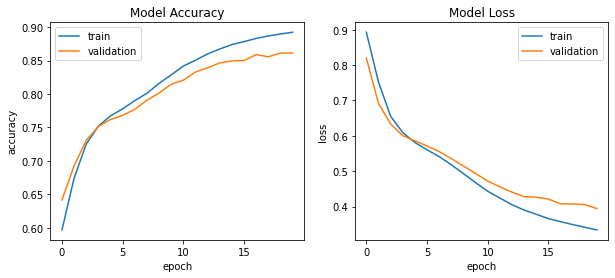

In [121]:
def plot_training_hist(history):
    '''Function to plot history for accuracy and loss'''
    
    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    # first plot
    ax[0].plot(history.history['accuracy'])
    ax[0].plot(history.history['val_accuracy'])
    ax[0].set_title('Model Accuracy')
    ax[0].set_xlabel('epoch')
    ax[0].set_ylabel('accuracy')
    ax[0].legend(['train', 'validation'], loc='best')
    # second plot
    ax[1].plot(history.history['loss'])
    ax[1].plot(history.history['val_loss'])
    ax[1].set_title('Model Loss')
    ax[1].set_xlabel('epoch')
    ax[1].set_ylabel('loss')
    ax[1].legend(['train', 'validation'], loc='best')
    
plot_training_hist(history)

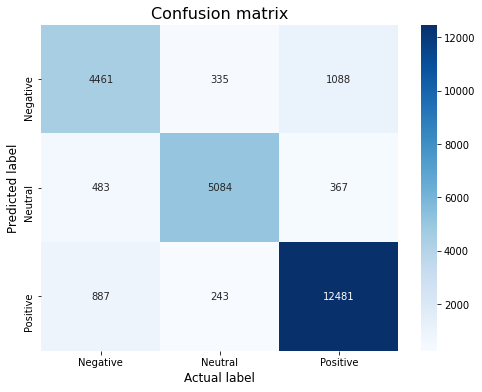

In [122]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, X_test, y_test):
    '''Function to plot confusion matrix for the passed model and the data'''
    
    sentiment_classes = ['Negative', 'Neutral', 'Positive']
    # use model to do the prediction
    y_pred = model.predict(X_test)
    # compute confusion matrix
    cm = confusion_matrix(np.argmax(np.array(y_test),axis=1), np.argmax(y_pred, axis=1))
    # plot confusion matrix
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, cmap=plt.cm.Blues, annot=True, fmt='d', 
                xticklabels=sentiment_classes,
                yticklabels=sentiment_classes)
    plt.title('Confusion matrix', fontsize=16)
    plt.xlabel('Actual label', fontsize=12)
    plt.ylabel('Predicted label', fontsize=12)
    
plot_confusion_matrix(model, X_test, y_test)

In [123]:
# Save the model architecture & the weights
model.save('best_model_20E.h5')
print('Best model saved')

Best model saved


In [136]:
from keras.models import load_model

# Load model
model = load_model('best_model_20E.h5')

def predict_class(text):
    '''Function to predict sentiment class of the passed text'''
    
    sentiment_classes = ['Negative', 'Neutral', 'Positive']
    max_len=50
    
    # Transforms text to a sequence of integers using a tokenizer object
    xt = tokenizer.texts_to_sequences(text)
    # Pad sequences to the same length
    xt = pad_sequences(xt, padding='post', maxlen=max_len)
    # Do the prediction using the loaded model
    yt = model.predict(xt).argmax(axis=1)
    # Print the predicted sentiment
    print('The predicted sentiment is', sentiment_classes[yt[0]])

In [134]:
predict_class(['"I hate when I have to call and wake people up'])

The predicted sentiment is Negative
